<a href="https://colab.research.google.com/github/taegukang35/ML-study/blob/main/keras_CNN_total.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import files
#drive.mount('/content/gdrive')

In [2]:
!pip install -q kaggle
uploaded = files.upload()
!mkdir -p ~/.kaggle
!cp kaggle.json ~/.kaggle/
!ls ~/.kaggle
!chmod 600 /root/.kaggle/kaggle.json
!kaggle datasets download -d chetankv/dogs-cats-images
!unzip '/content/dogs-cats-images.zip'

Streaming output truncated to the last 5000 lines.
  inflating: dog vs cat/dataset/training_set/cats/cat.37.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.370.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3700.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3701.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3702.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3703.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3704.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3705.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3706.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3707.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3708.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3709.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.371.jpg  
  inflating: dog vs cat/dataset/training_set/cats/cat.3710.jpg  
  inflating: dog vs cat/dataset/training_se

In [3]:
import os,shutil

original_dataset_dir = '/content/dog vs cat/dataset/training_set/'
base_dir = '/content/cats_and_dogs_small'
os.mkdir(base_dir)

In [4]:
train_dir = os.path.join(base_dir,'train')
os.mkdir(train_dir)
validation_dir = os.path.join(base_dir,'validation')
os.mkdir(validation_dir)
test_dir = os.path.join(base_dir,'test')
os.mkdir(test_dir)

In [5]:
train_cats_dir = os.path.join(train_dir,'cats')
os.mkdir(train_cats_dir)
train_dogs_dir = os.path.join(train_dir,'dogs')
os.mkdir(train_dogs_dir)

validation_cats_dir = os.path.join(validation_dir,'cats')
os.mkdir(validation_cats_dir)
validation_dogs_dir = os.path.join(validation_dir,'dogs')
os.mkdir(validation_dogs_dir)

test_cats_dir = os.path.join(test_dir,'cats')
os.mkdir(test_cats_dir)
test_dogs_dir = os.path.join(test_dir,'dogs')
os.mkdir(test_dogs_dir)

In [6]:
fnames = ['cat.{}.jpg'.format(i) for i in range(1,1000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir,'cats',fname)
    dst = os.path.join(train_cats_dir,fname)
    shutil.copyfile(src,dst)

fnames = ['cat.{}.jpg'.format(i) for i in range(1000,1500)]
for fname in fnames:
    src = os.path.join(original_dataset_dir,'cats',fname)
    dst = os.path.join(validation_cats_dir,fname)
    shutil.copyfile(src,dst)

fnames = ['cat.{}.jpg'.format(i) for i in range(1500,2000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir,'cats',fname)
    dst = os.path.join(test_cats_dir,fname)
    shutil.copyfile(src,dst)

In [7]:
fnames = ['dog.{}.jpg'.format(i) for i in range(1,1000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir,'dogs',fname)
    dst = os.path.join(train_dogs_dir,fname)
    shutil.copyfile(src,dst)
fnames = ['dog.{}.jpg'.format(i) for i in range(1000,1500)]
for fname in fnames:
    src = os.path.join(original_dataset_dir,'dogs',fname)
    dst = os.path.join(validation_dogs_dir,fname)
    shutil.copyfile(src,dst)
fnames = ['dog.{}.jpg'.format(i) for i in range(1500,2000)]
for fname in fnames:
    src = os.path.join(original_dataset_dir,'dogs',fname)
    dst = os.path.join(test_dogs_dir,fname)
    shutil.copyfile(src,dst)

In [8]:
from keras import layers
from keras import models

model = models.Sequential()
model.add(layers.Conv2D(32,(3,3),activation='relu',input_shape=(150,150,3)))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(64,(3,3),activation = 'relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128,(3,3),activation = 'relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Conv2D(128,(3,3),activation='relu'))
model.add(layers.MaxPooling2D((2,2)))
model.add(layers.Flatten())
model.add(layers.Dense(512,activation = 'relu'))
model.add(layers.Dense(1,activation = 'sigmoid'))


In [9]:
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       1

In [10]:
from keras import optimizers
model.compile(loss='binary_crossentropy',optimizer=optimizers.RMSprop(learning_rate=1e-4),metrics=['acc'])

In [11]:
from keras.preprocessing.image import ImageDataGenerator

train_datagen = ImageDataGenerator(rescale=1./255)
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size=(150,150),
    batch_size = 20,
    class_mode = 'binary'
)
validation_generator = test_datagen.flow_from_directory(
    validation_dir,
    target_size = (150,150),
    batch_size = 20,
    class_mode = 'binary'
)

Found 1998 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [12]:
for data_batch, labels_batch in train_generator:
    print("배치 데이터 크기",data_batch.shape)
    print("배치 레이블 크기: ",labels_batch.shape)
    break

배치 데이터 크기 (20, 150, 150, 3)
배치 레이블 크기:  (20,)


In [13]:
history = model.fit_generator(
    train_generator,
    steps_per_epoch = 100,
    epochs = 30,
    validation_data = validation_generator,
    validation_steps=50
)

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1915: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/30
100/100 [==============================] - 52s 92ms/step - loss: 0.6955 - acc: 0.5328 - val_loss: 0.6716 - val_acc: 0.5750
Epoch 2/30
100/100 [==============================] - 8s 85ms/step - loss: 0.6676 - acc: 0.5987 - val_loss: 0.6732 - val_acc: 0.5690
Epoch 3/30
100/100 [==============================] - 8s 85ms/step - loss: 0.6152 - acc: 0.6758 - val_loss: 0.6303 - val_acc: 0.6210
Epoch 4/30
100/100 [==============================] - 8s 85ms/step - loss: 0.5799 - acc: 0.6909 - val_loss: 0.5869 - val_acc: 0.6730
Epoch 5/30
100/100 [==============================] - 8s 83ms/step - loss: 0.5213 - acc: 0.7431 - val_loss: 0.5699 - val_acc: 0.6870
Epoch 6/30
100/100 [==============================] - 8s 83ms/step - loss: 0.4910 - acc: 0.7609 - val_loss: 0.5556 - val_acc: 0.7180
Epoch 7/30
100/100 [==============================] - 8s 85ms/step - loss: 0.4507 - acc: 0.7770 - val_loss: 0.5405 - val_acc: 0.7310
Epoch 8/30
100/100 [==============================] - 8s 84ms/step -

In [14]:
model.save('model1.h5')

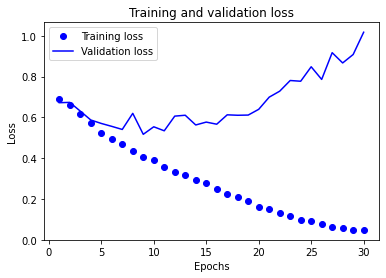

In [15]:
import matplotlib.pyplot as plt

history_dict = history.history
loss = history_dict['loss']
val_loss = history_dict['val_loss']
epochs = range(1,len(loss)+1)

plt.plot(epochs,loss,'bo',label='Training loss')
plt.plot(epochs,val_loss,'b',label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

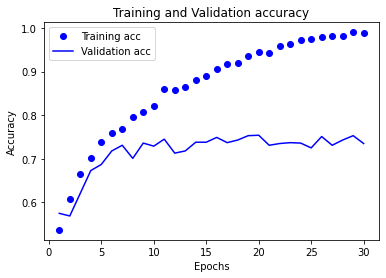

In [16]:
acc = history_dict['acc']
val_acc = history_dict['val_acc']

plt.plot(epochs,acc,'bo',label ='Training acc')
plt.plot(epochs,val_acc,'b',label='Validation acc')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [17]:
from keras.applications.vgg16 import VGG16 
conv_base = VGG16(weights = 'imagenet',include_top=False,input_shape = (150,150,3))

58900480/58889256 [==============================] - 0s 0us/step


In [18]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0     

In [19]:
import os 
import numpy as np
from keras.preprocessing.image import ImageDataGenerator

base_dir = '/content/cats_and_dogs_small'
train_dir = os.path.join(base_dir,'train')
validation_dir = os.path.join(base_dir,'validation')
test_dir = os.path.join(base_dir,'test')

datagen = ImageDataGenerator(rescale=1./255)
batch_size =20

def extract_features(directory,sample_count):
    features = np.zeros(shape=(sample_count,4,4,512))
    labels = np.zeros(shape=(sample_count))
    generator = datagen.flow_from_directory(
        directory,
        target_size=(150,150),
        batch_size= batch_size,
        class_mode = 'binary'
    )
    i=0
    for inputs_batch,labels_batch in generator:
        features_batch = conv_base.predict(inputs_batch)
        features[i*batch_size:(i+1)*batch_size] = features_batch
        labels[i*batch_size:(i+1)*batch_size] = labels_batch
        i += 1
        if i*batch_size >= sample_count:
            break
    return features,labels

train_features,train_labels = extract_features(train_dir,1998)
validation_features,validation_labels = extract_features(validation_dir,1000)
test_features, test_labels = extract_features(test_dir,1000)

Found 1998 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [20]:
train_features = np.reshape(train_features,(1998,4*4*512))
validation_features = np.reshape(validation_features,(1000,4*4*512))
test_features = np.reshape(test_features,(1000,4*4*512))

In [21]:
from keras import models
from keras import layers
from keras import optimizers

model = models.Sequential()
model.add(layers.Dense(256,activation='relu',input_dim=4*4*512))
model.add(layers.Dropout(0.5))
model.add(layers.Dense(1,activation='sigmoid'))

model.compile(optimizer = optimizers.RMSprop(learning_rate = 2e-5),
              loss = 'binary_crossentropy',
              metrics = ['acc'])

history = model.fit(train_features,train_labels,epochs = 30, batch_size = 20, validation_data = (validation_features,validation_labels))

Epoch 1/30
100/100 [==============================] - 2s 6ms/step - loss: 0.6477 - acc: 0.6354 - val_loss: 0.4277 - val_acc: 0.8440
Epoch 2/30
100/100 [==============================] - 0s 4ms/step - loss: 0.4502 - acc: 0.7984 - val_loss: 0.3539 - val_acc: 0.8700
Epoch 3/30
100/100 [==============================] - 0s 5ms/step - loss: 0.3679 - acc: 0.8475 - val_loss: 0.3197 - val_acc: 0.8780
Epoch 4/30
100/100 [==============================] - 0s 4ms/step - loss: 0.3195 - acc: 0.8639 - val_loss: 0.2953 - val_acc: 0.8860
Epoch 5/30
100/100 [==============================] - 0s 5ms/step - loss: 0.2808 - acc: 0.8841 - val_loss: 0.2799 - val_acc: 0.8960
Epoch 6/30
100/100 [==============================] - 0s 5ms/step - loss: 0.2529 - acc: 0.9013 - val_loss: 0.2664 - val_acc: 0.8960
Epoch 7/30
100/100 [==============================] - 0s 5ms/step - loss: 0.2584 - acc: 0.9007 - val_loss: 0.2610 - val_acc: 0.8970
Epoch 8/30
100/100 [==============================] - 0s 4ms/step - loss: 0.

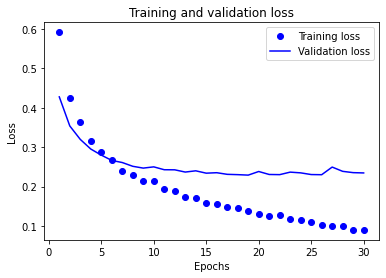

In [22]:
import matplotlib.pyplot as plt

history_dict = history.history
loss = history_dict['loss']
val_loss = history_dict['val_loss']
epochs = range(1,len(loss)+1)

plt.plot(epochs,loss,'bo',label='Training loss')
plt.plot(epochs,val_loss,'b',label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

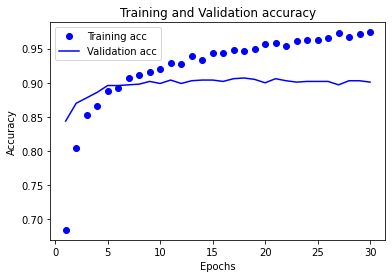

In [23]:
acc = history_dict['acc']
val_acc = history_dict['val_acc']

plt.plot(epochs,acc,'bo',label ='Training acc')
plt.plot(epochs,val_acc,'b',label='Validation acc')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [27]:
from keras import models
from keras import layers

model = models.Sequential()
model.add(conv_base)
model.add(layers.Flatten())
model.add(layers.Dense(256,activation='relu'))
model.add(layers.Dense(1,activation='sigmoid'))

In [28]:
model.summary()

Model: "sequential_2"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
vgg16 (Functional)           (None, 4, 4, 512)         14714688  
_________________________________________________________________
flatten_1 (Flatten)          (None, 8192)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 256)               2097408   
_________________________________________________________________
dense_5 (Dense)              (None, 1)                 257       
Total params: 16,812,353
Trainable params: 16,812,353
Non-trainable params: 0
_________________________________________________________________


In [35]:
print("conv_base 동결 이전 훈련되는 가중치 수 ",len(model.trainable_weights))

conv_base 동결 이전 훈련되는 가중치 수  30


In [36]:
conv_base.trainable = False

In [37]:
len(model.trainable_weights)

4

In [39]:
from keras.preprocessing.image import ImageDataGenerator
from keras import optimizers

tarin_datagen = ImageDataGenerator(
    rescale = 1./255,
    rotation_range = 20,
    width_shift_range = 0.1,
    height_shift_range = 0.1,
    shear_range = 0.1,
    zoom_range = 0.1,
    horizontal_flip = True,
    fill_mode = 'nearest'
)

In [41]:
test_datagen = ImageDataGenerator(rescale=1./255)

train_generator = train_datagen.flow_from_directory(
    train_dir,
    target_size = (150,150),
    batch_size = 20,
    class_mode = 'binary'
)

validation_generator = train_datagen.flow_from_directory(
    validation_dir,
    target_size = (150,150),
    batch_size = 20,
    class_mode = 'binary'
)

model.compile(loss = 'binary_crossentropy',optimizer = optimizers.RMSprop(learning_rate = 2e-5),metrics = ['acc'])

Found 1998 images belonging to 2 classes.
Found 1000 images belonging to 2 classes.


In [42]:
history = model.fit_generator(
    train_generator,
    steps_per_epoch = 100,
    epochs = 30,
    validation_data = validation_generator,
    validation_steps =50,
    verbose=2
)
model.save('model2.h5')

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1915: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/30
100/100 - 11s - loss: 0.4922 - acc: 0.7863 - val_loss: 0.3827 - val_acc: 0.8650
Epoch 2/30
100/100 - 9s - loss: 0.3423 - acc: 0.8684 - val_loss: 0.3164 - val_acc: 0.8790
Epoch 3/30
100/100 - 9s - loss: 0.2847 - acc: 0.8894 - val_loss: 0.2868 - val_acc: 0.8880
Epoch 4/30
100/100 - 9s - loss: 0.2481 - acc: 0.9044 - val_loss: 0.2735 - val_acc: 0.8930
Epoch 5/30
100/100 - 9s - loss: 0.2223 - acc: 0.9169 - val_loss: 0.2591 - val_acc: 0.8940
Epoch 6/30
100/100 - 9s - loss: 0.2033 - acc: 0.9299 - val_loss: 0.2508 - val_acc: 0.9040
Epoch 7/30
100/100 - 9s - loss: 0.1832 - acc: 0.9384 - val_loss: 0.2431 - val_acc: 0.9090
Epoch 8/30
100/100 - 9s - loss: 0.1702 - acc: 0.9434 - val_loss: 0.2392 - val_acc: 0.9090
Epoch 9/30
100/100 - 9s - loss: 0.1579 - acc: 0.9484 - val_loss: 0.2362 - val_acc: 0.9100
Epoch 10/30
100/100 - 10s - loss: 0.1448 - acc: 0.9530 - val_loss: 0.2353 - val_acc: 0.9070
Epoch 11/30
100/100 - 9s - loss: 0.1374 - acc: 0.9565 - val_loss: 0.2324 - val_acc: 0.9080
Epoch 

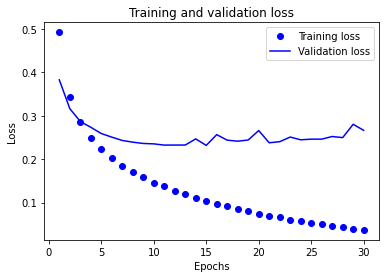

In [43]:
import matplotlib.pyplot as plt

history_dict = history.history
loss = history_dict['loss']
val_loss = history_dict['val_loss']
epochs = range(1,len(loss)+1)

plt.plot(epochs,loss,'bo',label='Training loss')
plt.plot(epochs,val_loss,'b',label='Validation loss')
plt.title('Training and validation loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.show()

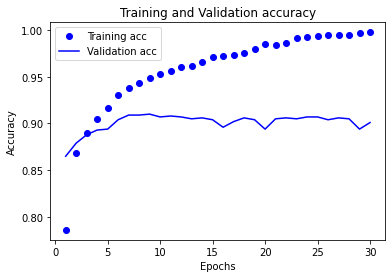

In [44]:
acc = history_dict['acc']
val_acc = history_dict['val_acc']

plt.plot(epochs,acc,'bo',label ='Training acc')
plt.plot(epochs,val_acc,'b',label='Validation acc')
plt.title('Training and Validation accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.show()

In [46]:
conv_base.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 150, 150, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 150, 150, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 150, 150, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 75, 75, 64)        0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 75, 75, 128)       73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 75, 75, 128)       147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 37, 37, 128)       0     

In [48]:
conv_base.trainable = True

set_trainable = False
for layer in conv_base.layers:
  if layer.name == 'block5_conv1':
    set_trainable = True
  if set_trainable:
    layer.trainable = True
  else:
    layer.trainable = False

In [50]:
model.compile(loss='binary_crossentropy',
              optimizer = optimizers.RMSprop(learning_rate = 1e-5),
              metrics = ['acc'])

history = model.fit_generator(
    train_generator,
    steps_per_epoch = 100,
    epochs = 100,
    validation_data = validation_generator,
    validation_steps = 50
)

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:1915: UserWarning: `Model.fit_generator` is deprecated and will be removed in a future version. Please use `Model.fit`, which supports generators.
  warnings.warn('`Model.fit_generator` is deprecated and '


Epoch 1/100
100/100 [==============================] - 13s 110ms/step - loss: 0.0436 - acc: 0.9887 - val_loss: 0.2590 - val_acc: 0.9080
Epoch 2/100
100/100 [==============================] - 10s 103ms/step - loss: 0.0110 - acc: 0.9999 - val_loss: 0.2695 - val_acc: 0.9100
Epoch 3/100
100/100 [==============================] - 10s 104ms/step - loss: 0.0044 - acc: 0.9997 - val_loss: 0.3622 - val_acc: 0.9010
Epoch 4/100
100/100 [==============================] - 10s 103ms/step - loss: 0.0023 - acc: 1.0000 - val_loss: 0.3288 - val_acc: 0.9140
Epoch 5/100
100/100 [==============================] - 10s 104ms/step - loss: 0.0010 - acc: 1.0000 - val_loss: 0.3983 - val_acc: 0.9100
Epoch 6/100
100/100 [==============================] - 10s 104ms/step - loss: 5.5749e-04 - acc: 1.0000 - val_loss: 0.3780 - val_acc: 0.9230
Epoch 7/100
100/100 [==============================] - 10s 104ms/step - loss: 5.1027e-04 - acc: 1.0000 - val_loss: 0.3625 - val_acc: 0.9170
Epoch 8/100
100/100 [===================

In [52]:
from keras.models import load_model
model = load_model('model1.h5')
model.summary()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d (Conv2D)              (None, 148, 148, 32)      896       
_________________________________________________________________
max_pooling2d (MaxPooling2D) (None, 74, 74, 32)        0         
_________________________________________________________________
conv2d_1 (Conv2D)            (None, 72, 72, 64)        18496     
_________________________________________________________________
max_pooling2d_1 (MaxPooling2 (None, 36, 36, 64)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 34, 34, 128)       73856     
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 17, 17, 128)       0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 15, 15, 128)       1

In [221]:
img_path = '/content/cats_and_dogs_small/test/cats/cat.1700.jpg'

from keras.preprocessing import image
import numpy as np

img = image.load_img(img_path,target_size=(150,150))
img_tensor = image.img_to_array(img)

In [222]:
img_tensor.shape

(150, 150, 3)

In [223]:
img_tensor = np.expand_dims(img_tensor,axis=0)
img_tensor /= 255.
print(img_tensor.shape)

(1, 150, 150, 3)


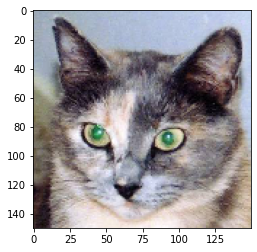

In [224]:
import matplotlib.pyplot as plt

plt.imshow(img_tensor[0])

In [225]:
from keras import models

layer_outputs = [layer.output for layer in model.layers[:8]]
#입력에 대해 8개 층의 출력을 반환. 
activation_model = models.Model(inputs=model.input,outputs=layer_outputs)
activations = activation_model.predict(img_tensor)

In [226]:
print(activations[1].shape)

(1, 74, 74, 32)


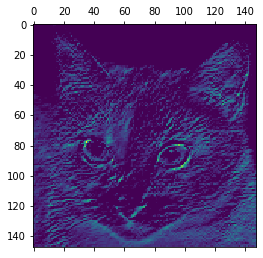

In [229]:
plt.matshow(activations[0][0,:,:,20],cmap = 'viridis')

<Figure size 432x288 with 0 Axes>

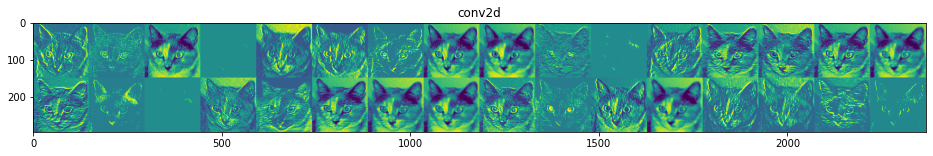

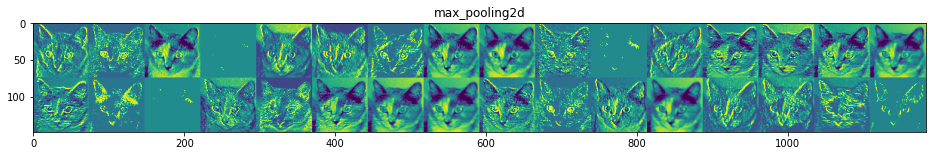

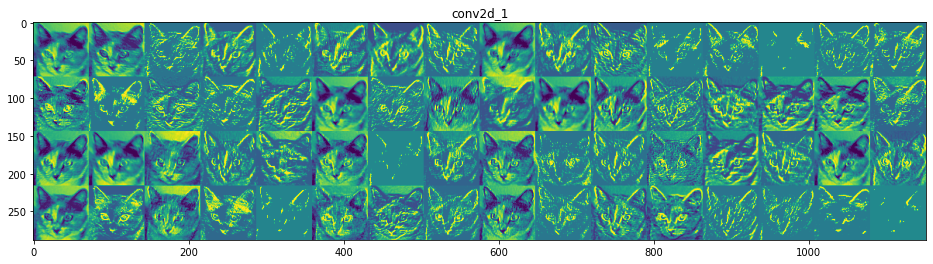

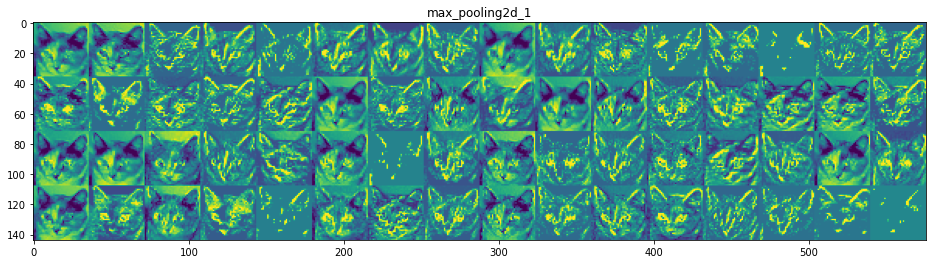

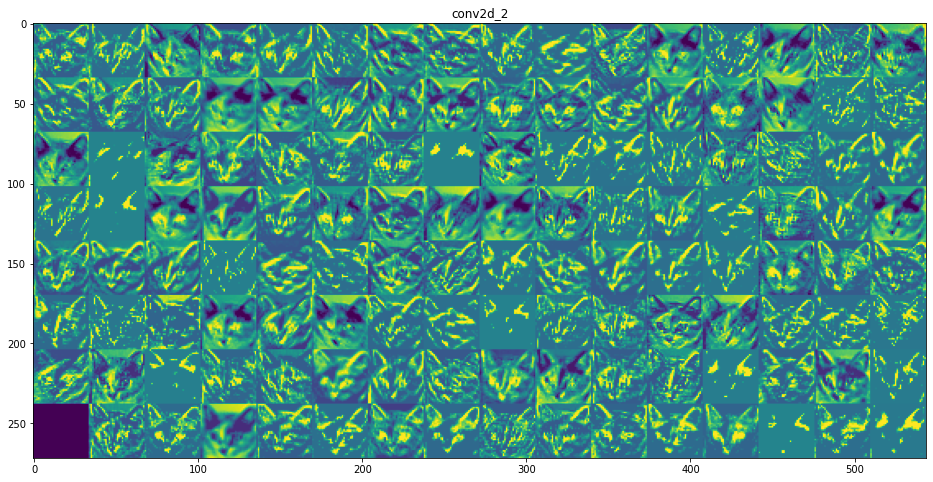

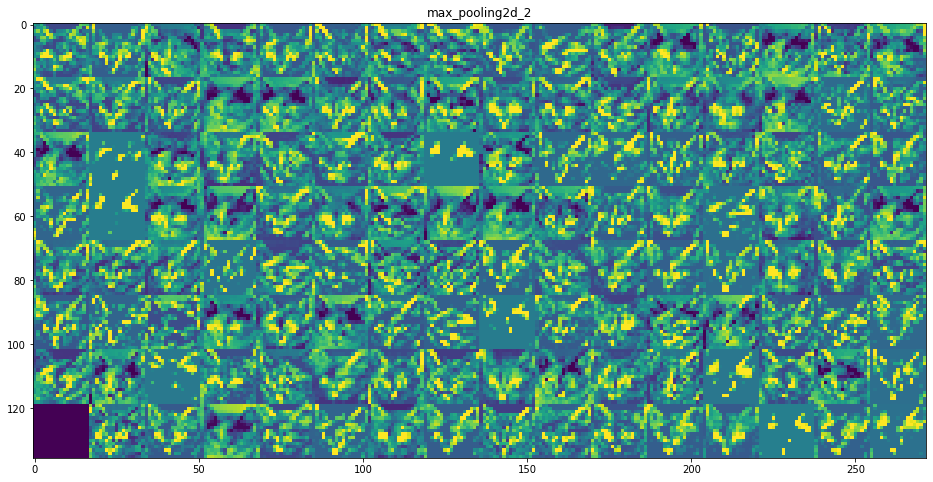

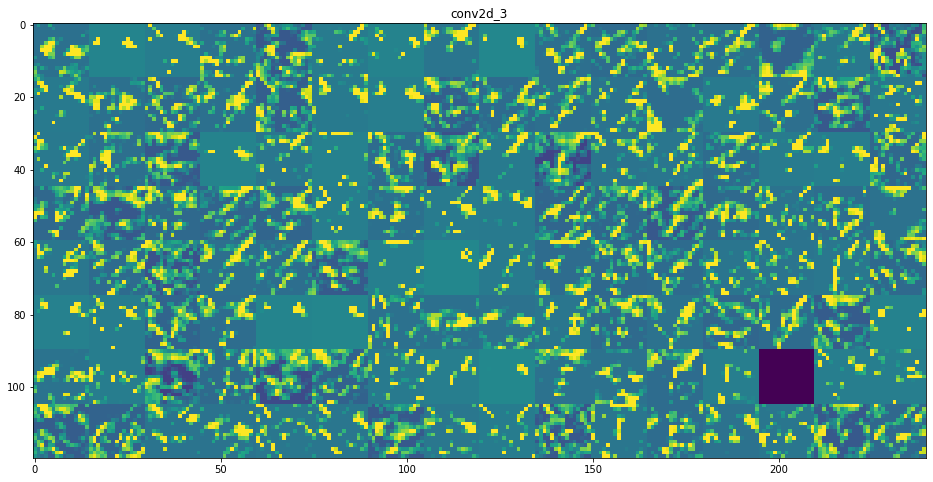

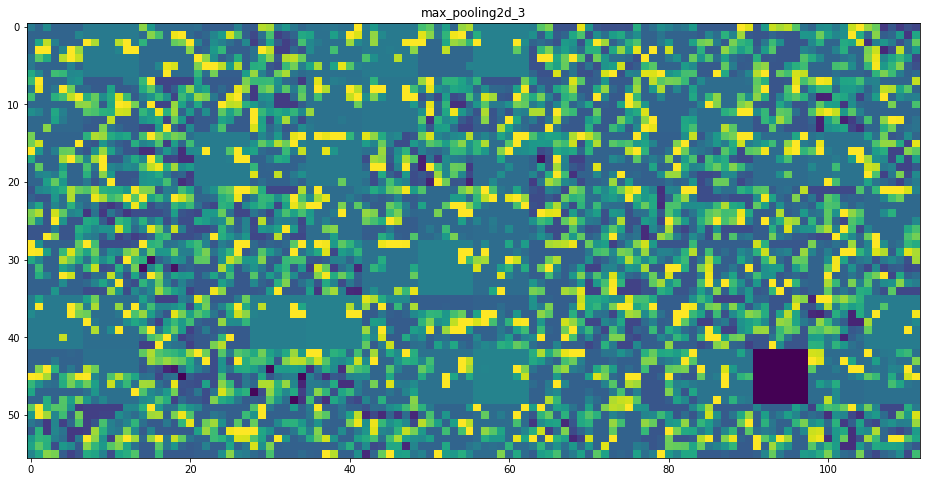

In [233]:
plt.clf()
layer_names = []
for layer in model.layers[:8]:
  layer_names.append(layer.name)
images_per_row = 16

for layer_name, layer_activation in zip(layer_names,activations):
  n_features = layer_activation.shape[-1] # 특성 맵에 있는 특성의 수
  size = layer_activation.shape[1]  # (1,size,size,n_features)
  n_cols = n_features // images_per_row
  display_grid = np.zeros((size*n_cols,images_per_row*size))

  for col in range(n_cols):
    for row in range(images_per_row):
      channel_image = layer_activation[0,:,:,col*images_per_row+row]
      channel_image -= channel_image.mean()
      channel_image /= channel_image.std()
      channel_image *= 64
      channel_image += 128
      channel_image = np.clip(channel_image,0,255).astype('uint8')
      display_grid[col*size:(col+1)*size,row*size:(row+1)*size] = channel_image
  scale = 1./size
  plt.figure(figsize=(scale*display_grid.shape[1],scale*display_grid.shape[0]))
  plt.title(layer_name)
  plt.grid(False)
  plt.imshow(display_grid,aspect='auto',cmap='viridis')

In [246]:
# 필터 시각화를 위한 손실 텐서 정의 
from keras.applications.vgg16 import VGG16
import tensorflow as tf
tf.compat.v1.disable_eager_execution()

model = VGG16(weights='imagenet',include_top = False)
layer_name = 'block3_conv1'
filter_index = 0

layer_output = model.get_layer(layer_name).output
loss = K.mean(layer_output[:,:,:,filter_index])

In [248]:
# 입력에 대한 손실의 그래디언트 구하기 
grads = K.gradients(loss,model.input)[0]

In [250]:
grads /= (K.sqrt(K.mean(K.square(grads))) + 1e-5)

In [252]:
iterate = K.function([model.input],[loss,grads])

import numpy as np
loss_value,gras_value = iterate([np.zeros((1,150,150,3))])

In [253]:
input_img_data = np.random.random((1,50,150,3))*20 + 128.

step = 1.
for i in range(40):
  loss_value,grads_value = iterate([input_img_data])
  input_img_data += grads_value*step

In [254]:
def deprocess_image(x):
  x -= x.mean()
  x /= (x.std() + 1e-5)
  x *= 0.1 

  x += 0.5
  x = np.clip(x,0,1)

  x *= 255
  x = np.clip(x,0,255).astype('uint8')
  return x

In [258]:
def generate_pattern(layer_name,filter_index,size = 150):
  # 주어진 층과 필터의 활성화를 최대화하기 위한 손실 함수 정의
  layer_output = model.get_layer(layer_name).output
  loss = K.mean(layer_output[:,:,:,filter_index])
  #손실에 대한 입력 이미지의 그래디언트를 계산
  grads = K.gradients(loss,model.input)[0]
  #그래디언트 정규화 
  grads /= (K.sqrt(K.mean(K.square(grads)))+1e-5)

  iterate = K.function([model.input],[loss,grads])
  input_img_data = np.random.random((1,size,size,3))*20 + 128.

  step = 1.
  for i in range(40):
    loss_value,grads_value = iterate([input_img_data])
    input_img_data += grads_value * step
  
  img = input_img_data[0]
  return deprocess_image(img)

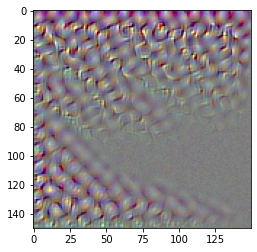

In [262]:
plt.imshow(generate_pattern('block3_conv2',0))

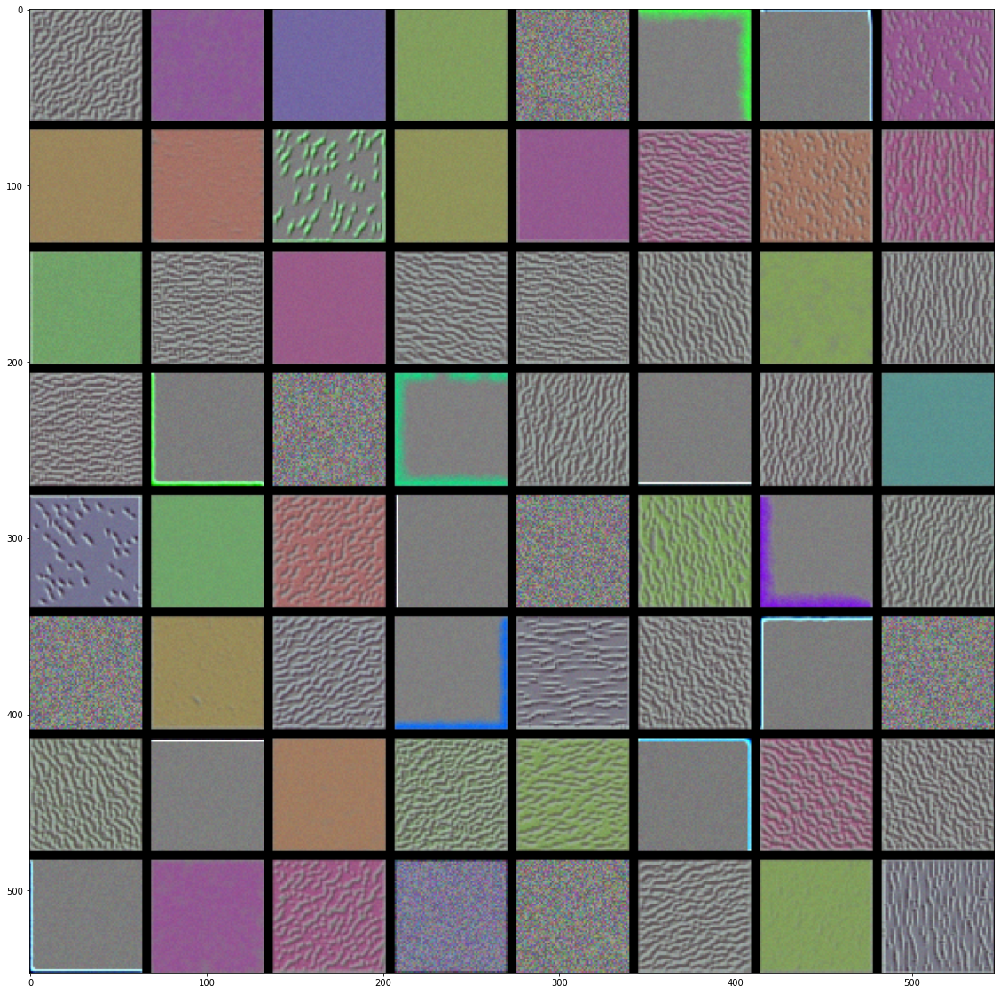

In [277]:
layer_name = 'block1_conv1'
size = 64
margin = 5

results = np.zeros((8*size + 7*margin,8*size + 7*margin,3),dtype = 'uint8')
for i in range(8):
  for j in range(8):
    # layer_name 에 있는 i+ (j+8)번째 필터에 대한 패턴을 생성
    filter_img = generate_pattern(layer_name,i+(j*8),size=size)
    # results 그리드의 (i,j)번째 위치에 저장
    horizontal_start = i*size + i*margin
    horizontal_end = horizontal_start + size
    vertical_start = j*size + j*margin
    vertical_end = vertical_start + size
    results[horizontal_start:horizontal_end,vertical_start:vertical_end,:] = filter_img

# block1_conv1 층의 필터 패턴를 
plt.figure(figsize =(20,20))
plt.imshow(results)

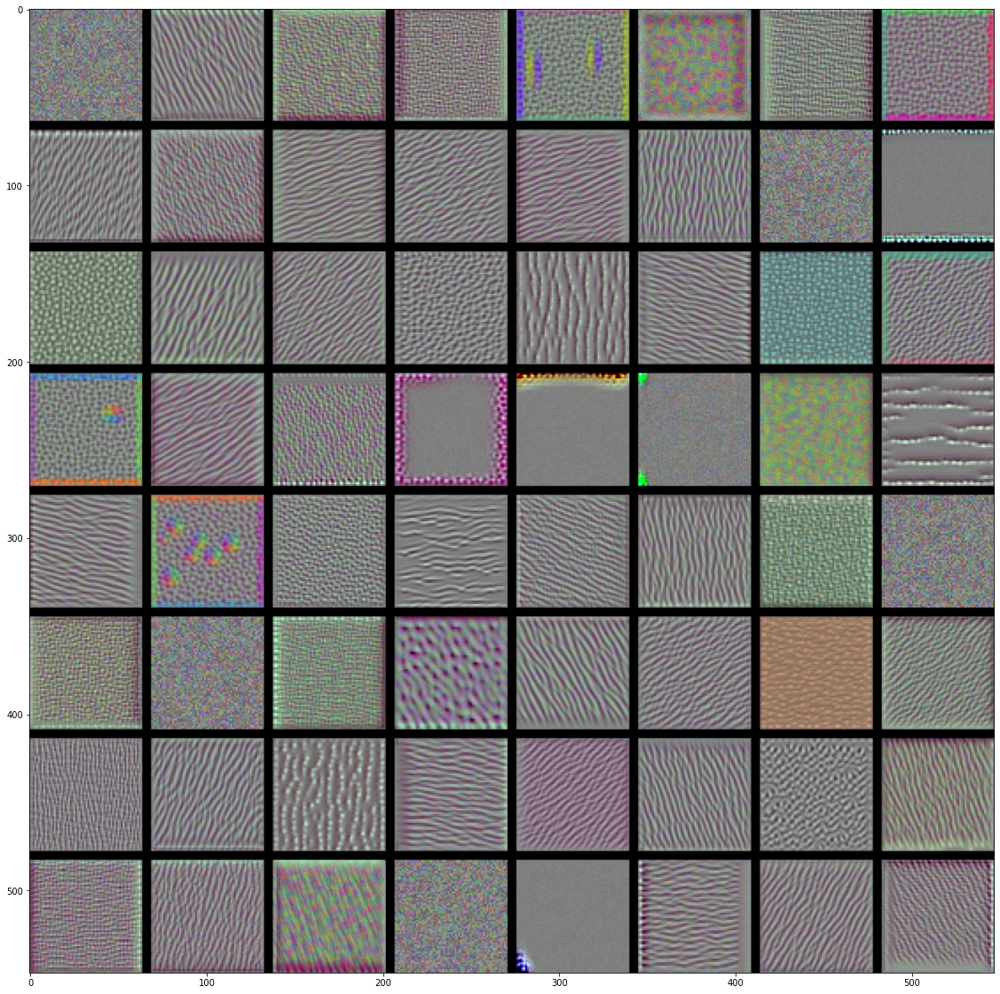

In [278]:
layer_name = 'block2_conv1'
size = 64
margin = 5

results = np.zeros((8*size + 7*margin,8*size + 7*margin,3),dtype = 'uint8')
for i in range(8):
  for j in range(8):
    # layer_name 에 있는 i+ (j+8)번째 필터에 대한 패턴을 생성
    filter_img = generate_pattern(layer_name,i+(j*8),size=size)
    # results 그리드의 (i,j)번째 위치에 저장
    horizontal_start = i*size + i*margin
    horizontal_end = horizontal_start + size
    vertical_start = j*size + j*margin
    vertical_end = vertical_start + size
    results[horizontal_start:horizontal_end,vertical_start:vertical_end,:] = filter_img

# block2_conv1 층의 필터 패턴를 
plt.figure(figsize =(20,20))
plt.imshow(results)

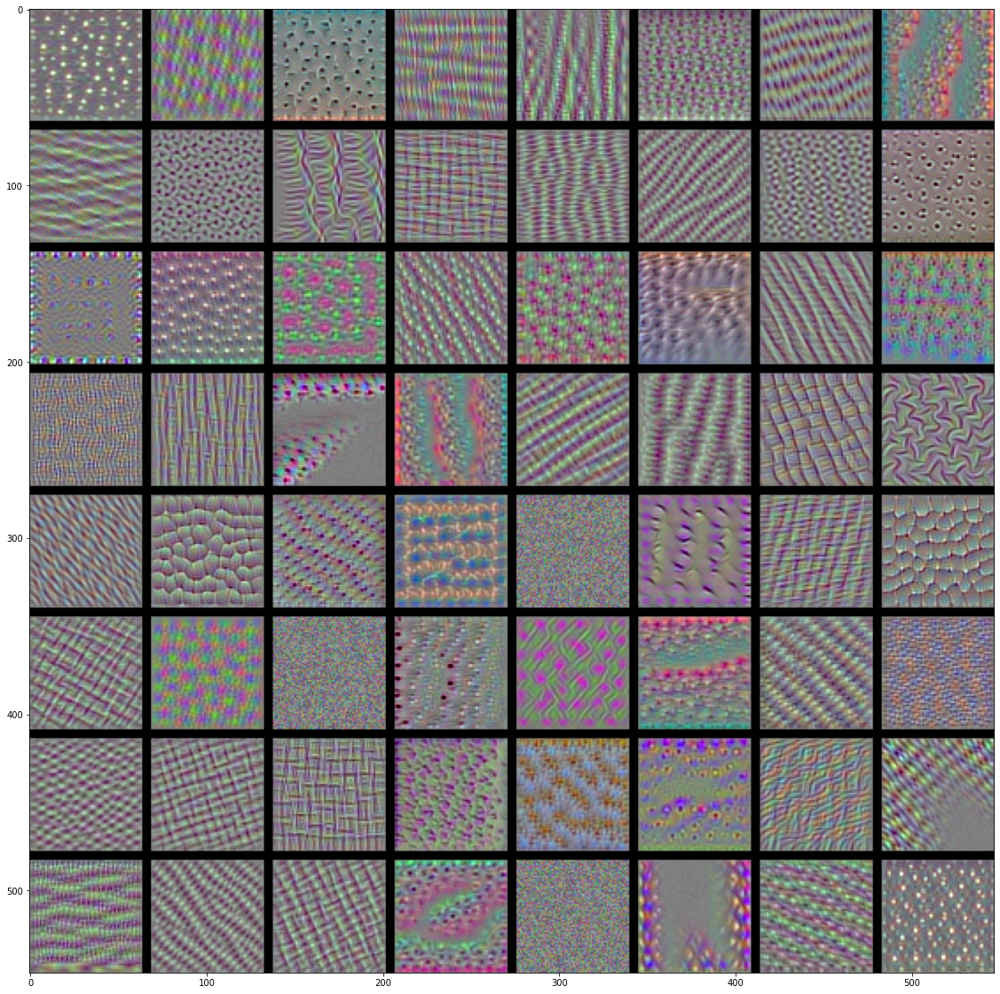

In [279]:
layer_name = 'block3_conv1'
size = 64
margin = 5

results = np.zeros((8*size + 7*margin,8*size + 7*margin,3),dtype = 'uint8')
for i in range(8):
  for j in range(8):
    # layer_name 에 있는 i+ (j+8)번째 필터에 대한 패턴을 생성
    filter_img = generate_pattern(layer_name,i+(j*8),size=size)
    # results 그리드의 (i,j)번째 위치에 저장
    horizontal_start = i*size + i*margin
    horizontal_end = horizontal_start + size
    vertical_start = j*size + j*margin
    vertical_end = vertical_start + size
    results[horizontal_start:horizontal_end,vertical_start:vertical_end,:] = filter_img

# block3_conv1 층의 필터 패턴를 
plt.figure(figsize =(20,20))
plt.imshow(results)

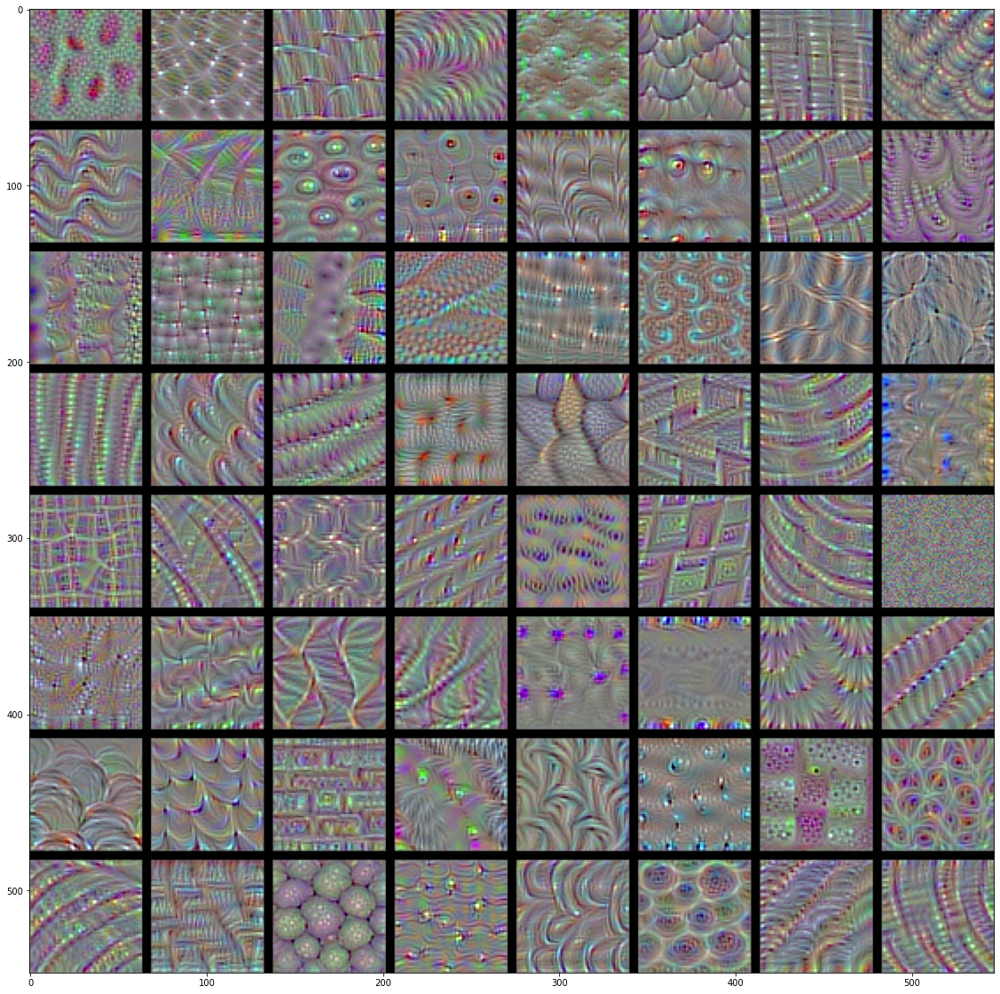

In [280]:
layer_name = 'block4_conv1'
size = 64
margin = 5

results = np.zeros((8*size + 7*margin,8*size + 7*margin,3),dtype = 'uint8')
for i in range(8):
  for j in range(8):
    # layer_name 에 있는 i+ (j+8)번째 필터에 대한 패턴을 생성
    filter_img = generate_pattern(layer_name,i+(j*8),size=size)
    # results 그리드의 (i,j)번째 위치에 저장
    horizontal_start = i*size + i*margin
    horizontal_end = horizontal_start + size
    vertical_start = j*size + j*margin
    vertical_end = vertical_start + size
    results[horizontal_start:horizontal_end,vertical_start:vertical_end,:] = filter_img

plt.figure(figsize =(20,20))
plt.imshow(results)

In [6]:
from keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet')

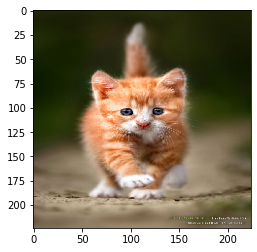

In [7]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input,decode_predictions
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from keras import backend as K
tf.compat.v1.disable_eager_execution()

img_path = "/content/cats-gdragon-sunny-cat-41468892-533-800.jpg"
img = image.load_img(img_path,target_size=(224,224))
x = image.img_to_array(img)
x = np.expand_dims(x,axis=0)
x = preprocess_input(x)
plt.imshow(img)

In [8]:
preds = model.predict(x)

/usr/local/lib/python3.7/dist-packages/keras/engine/training.py:2401: UserWarning: `Model.state_updates` will be removed in a future version. This property should not be used in TensorFlow 2.0, as `updates` are applied automatically.
  warnings.warn('`Model.state_updates` will be removed in a future version. '


In [9]:
print("Predicted: ",decode_predictions(preds,top=3)[0])

49152/35363 [=========================================] - 0s 0us/step
Predicted:  [('n02123159', 'tiger_cat', 0.4470188), ('n02119022', 'red_fox', 0.13196018), ('n02124075', 'Egyptian_cat', 0.1106485)]


In [10]:
np.argmax(preds[0])

282

In [11]:
model.summary()

Model: "vgg16"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
input_1 (InputLayer)         [(None, 224, 224, 3)]     0         
_________________________________________________________________
block1_conv1 (Conv2D)        (None, 224, 224, 64)      1792      
_________________________________________________________________
block1_conv2 (Conv2D)        (None, 224, 224, 64)      36928     
_________________________________________________________________
block1_pool (MaxPooling2D)   (None, 112, 112, 64)      0         
_________________________________________________________________
block2_conv1 (Conv2D)        (None, 112, 112, 128)     73856     
_________________________________________________________________
block2_conv2 (Conv2D)        (None, 112, 112, 128)     147584    
_________________________________________________________________
block2_pool (MaxPooling2D)   (None, 56, 56, 128)       0     

In [12]:
# Grad-CAM 적용하는 과정. 
output = model.output[:,np.argmax(preds[0])]
last_conv_layer = model.layers[-6]
# block5_conv의 특성 맵 출력에 대한 클래스의 그래디언트 
grads = K.gradients(output,last_conv_layer.output)[0]
print(grads.shape)
# 특성 맵 채널별 그래디언트 평균값이 담딘 (512,) 크기의 벡터 
pooled_grads = K.mean(grads,axis=(0,1,2))
print(pooled_grads)
#샘플 이미지가 주어졌을 때 방금 전 정의한 pooled_grads와 block5_conv3의 특성 맵 출력을 구함. 
iterate = K.function([model.input],[pooled_grads,last_conv_layer.output[0]])
pooled_grads_value,conv_layer_output_value = iterate([x])

for i in range(512):
  conv_layer_output_value[:,:,i] *= pooled_grads_value[i]

(None, 14, 14, 512)
Tensor("Mean:0", shape=(512,), dtype=float32)


In [13]:
# 만들어진 특성 맵에서 채널 축을 따라 평균한 값이 클래스 활성화의 히트맵
heatmap = np.mean(conv_layer_output_value,axis=-1)

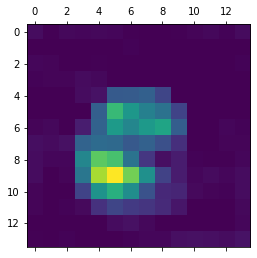

In [14]:
## ReLU를 씌원 음수를 0으로 만든다. 
heatmap = np.maximum(heatmap,0)
heatmap /= np.max(heatmap)
plt.matshow(heatmap)
plt.show()

In [15]:
import cv2
img = cv2.imread(img_path)
heatmap = cv2.resize(heatmap,(img.shape[1],img.shape[0]))
heatmap = np.uint8(255*heatmap) #heatmap을 RGB 포맷으로 변환
heatmap = cv2.applyColorMap(heatmap,cv2.COLORMAP_JET) #히트맵으로 변환
superimposed_img = heatmap*0.4 + img
cv2.imwrite('/content/elephant_cam.jpg',superimposed_img)

True

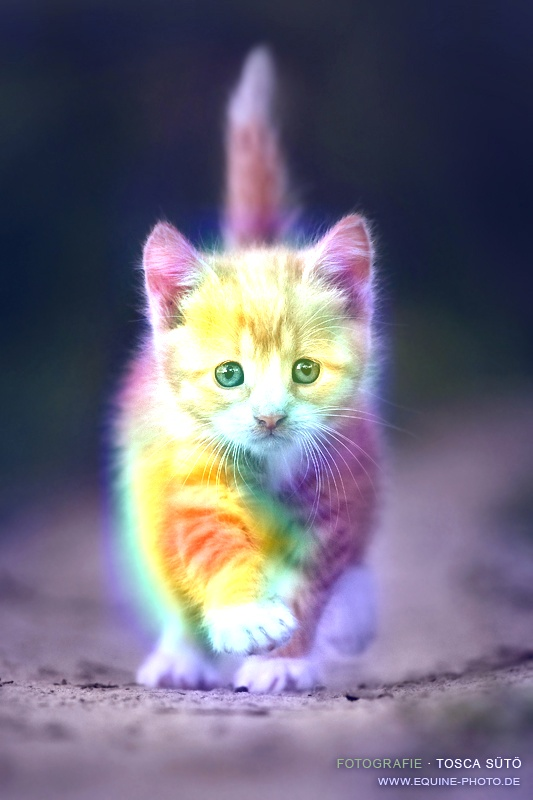

In [16]:
from IPython.display import Image
Image('/content/elephant_cam.jpg')

이제 이것을 함수로 만들어서 쉽게 사용하도록 해보자!

---



In [35]:
from keras.applications.vgg16 import VGG16
model = VGG16(weights='imagenet')

In [102]:
from keras.preprocessing import image
from keras.applications.vgg16 import preprocess_input,decode_predictions
import numpy as np
import tensorflow as tf
import matplotlib.pyplot as plt
from keras import backend as K
tf.compat.v1.disable_eager_execution()

In [93]:
## https://jsideas.net/grad_cam/ 코드 참고 
def generate_grad_cam(img_tensor,model,class_index,activation_layer):
  inp = model.input
  y_c = model.output.op.inputs[0][0,class_index]
  A_k = model.get_layer(activation_layer).output
  
  ## 이미지 텐서 입력받아 해당 activation 레이어의 A_k와 
  ## 소프트맥스 함수 인풋의 A_k에 대한 gradient를 구한다. 
  get_output = K.function([inp],[A_k,K.gradients(y_c,A_k)[0],model.output])
  [conv_output,grad_val,model_output] = get_output([img_tensor])
  
  ## 배치 사이즈가 1이므로 배치 차원 없앰. 
  conv_output = conv_output[0]
  grad_val = grad_val[0]

  ## 구한 gradient를 픽셀 가로세로 평균내어 a^c_k를 계산 
  weights = np.mean(grad_val,axis = (0,1))

  ## 추출한 conv_output에 weight를 곱하고 합해 grad_cam을 얻는다. 
  grad_cam = np.zeros(dtype = np.float32, shape = conv_output.shape[0:2])
  for k,w in enumerate(weights):
    grad_cam += w*conv_output[:,:,k]
  grad_cam = cv2.resize(grad_cam,(224,224))
  
  ## ReLU를 씌워 음수를 0으로 만든다. 
  grad_cam = np.maximum(grad_cam,0)
  
  grad_cam = grad_cam/grad_cam.max()
  return grad_cam

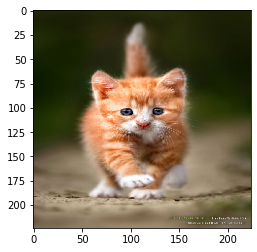

In [108]:
img_path = "/content/cats-gdragon-sunny-cat-41468892-533-800.jpg"
img = image.load_img(img_path,target_size=(224,224))
x = image.img_to_array(img)
x = np.expand_dims(x,axis=0)
x = preprocess_input(x)
plt.imshow(img)

In [121]:
grad_cam = generate_grad_cam(x,model,np.argmax(preds[0]),model.layers[-6].name)

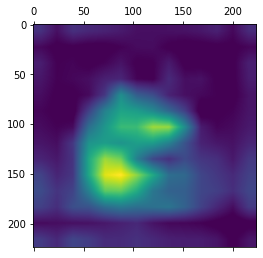

In [122]:
plt.matshow(grad_cam)

In [123]:
import cv2
img = cv2.imread(img_path)
heatmap = cv2.resize(grad_cam,(img.shape[1],img.shape[0]))
heatmap = np.uint8(255*heatmap) #heatmap을 RGB 포맷으로 변환
heatmap = cv2.applyColorMap(heatmap,cv2.COLORMAP_JET) #히트맵으로 변환
superimposed_img = heatmap*0.4 + img
cv2.imwrite('/content/grad_cam.jpg',superimposed_img)

True

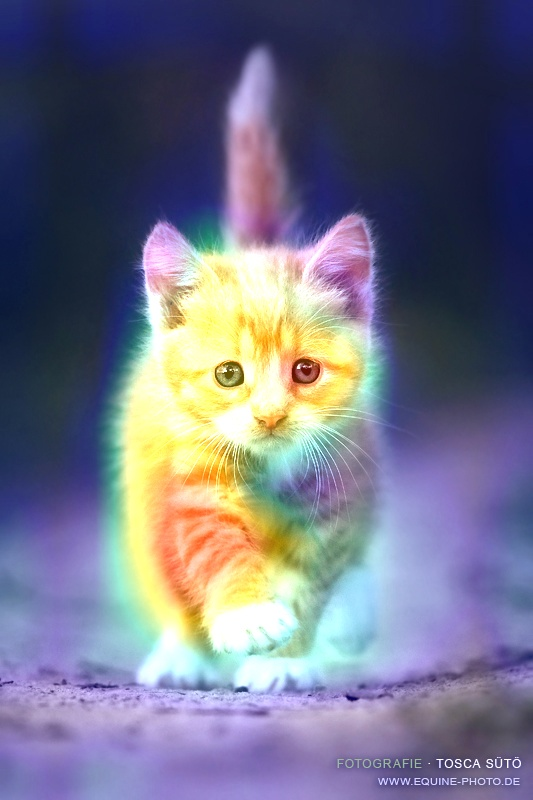

In [124]:
from IPython.display import Image
Image('/content/grad_cam.jpg')

이제 R&E에서 사용하는 모델을 불러와 적용해보자!